# We want to plot our data to study

- pair plot all features

- auto correlation in the time serie

In [1]:
import pandas as pd

# just a copy of the previous funciton to load and clean our dataset

def clean_data(path1, path2):
    """
    We call this function everytime after reading the 2 csv files if we want to clean our data.
    This function removes the outliers which are error in annotations (outlier gas price) and fill Nan values.
    """

    # We load the dataframes and rename Unnamed: 0 in time(hour) and time(day)
    path = "/home/lucien/Bureau/Lucien_Rondier_Work/data/"
    df1 = pd.read_csv(path + path1)
    df2 = pd.read_csv(path + path2)
    df1 = df1.rename(columns={'Unnamed: 0': 'time(hour)'})
    df2 = df2.rename(columns={'Unnamed: 0': 'time(day)'})

    # We clean df1: this is just a forward fill on 3 columns (see the previous notebook to see why)
    df1[['power.de.avail.aggr.lignite.mw.h.obs.cet.3mv', 
    'power.de.avail.aggr.nuclear.mw.h.obs.cet.3mv', 
    'power.de.avail.aggr.coal.mw.h.obs.cet.3mv']] = df1[['power.de.avail.aggr.lignite.mw.h.obs.cet.3mv', 
                                                        'power.de.avail.aggr.nuclear.mw.h.obs.cet.3mv', 
                                                        'power.de.avail.aggr.coal.mw.h.obs.cet.3mv']].ffill()

    # We clean df2: we delete an outlier and make forward fill and then one backward fill
    target_date = '2023-04-11' # target 
    target_index = df2[df2['time(day)'] == target_date].index[0]
    df2.loc[target_index, 'price.naturalgas.ncg.delivery.powernext.eur.mwh'] = df2.loc[target_index - 1, 'price.naturalgas.ncg.delivery.powernext.eur.mwh']

    df2[['power.price.co2.eua.eurot.d.obs', 'coal.price.api2_ara.euromwh.d.obs']] = df2[
        ['power.price.co2.eua.eurot.d.obs', 'coal.price.api2_ara.euromwh.d.obs']
    ].ffill()

    df2[['power.price.co2.eua.eurot.d.obs', 'coal.price.api2_ara.euromwh.d.obs']] = df2[
        ['power.price.co2.eua.eurot.d.obs', 'coal.price.api2_ara.euromwh.d.obs']
    ].bfill()

    # Now we concatenate the two dataframes, repeating the 3 same prices of the day for every hour thanks to a left join

    df1['time(day)'] = pd.to_datetime(df1['time(hour)']).dt.date

    # Conversion de la colonne 'time(day)' de df2 au format date pour correspondre à df1
    df2['time(day)'] = pd.to_datetime(df2['time(day)']).dt.date

    # join df1 and df2
    df_merged = pd.merge(df1, df2, on='time(day)', how='left')

    # we delete the day time column
    df_merged = df_merged.drop(columns=['time(day)'])

    return df_merged

## 1) Pair plot between every features to watch correlation

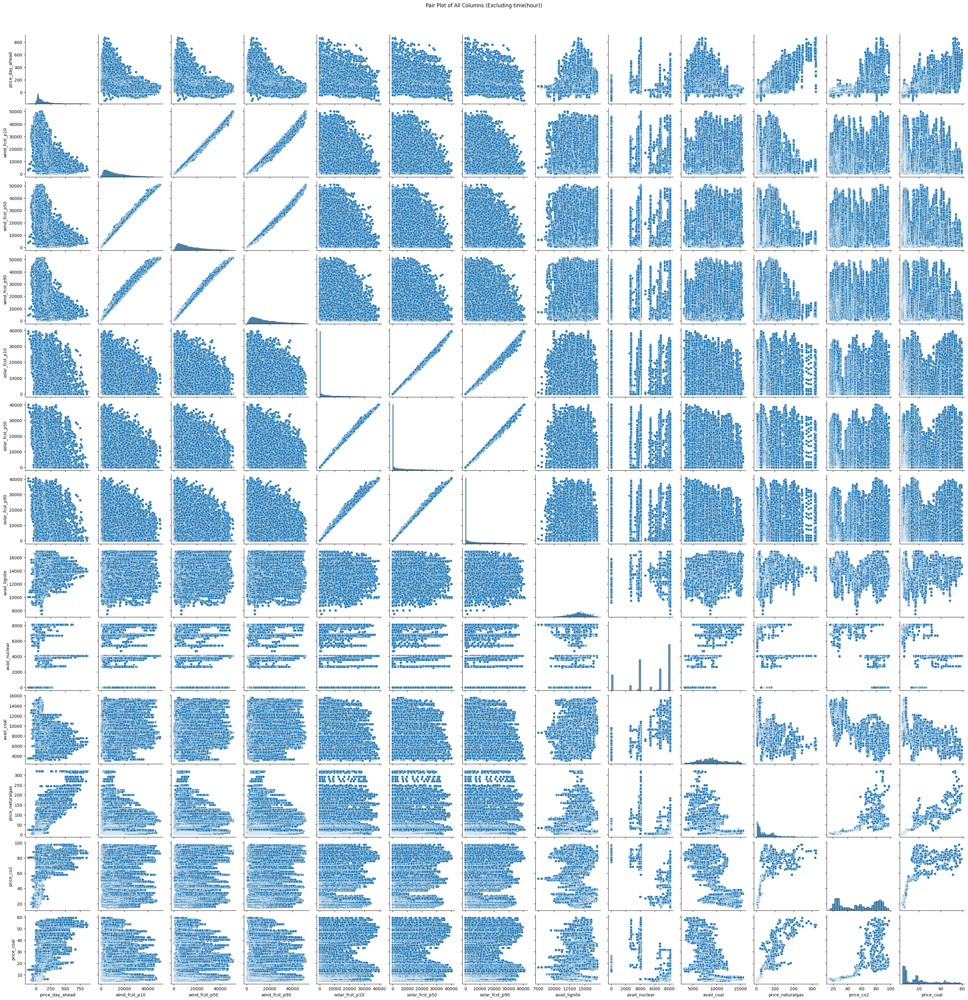

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load and clean the data
path1, path2 = "data1.csv", "data2.csv"
df = clean_data(path1, path2)

# Drop 'time(hour)' column
df = df.drop(columns=['time(hour)'])

column_renaming = {
    'power.de.price.day_ahead.euromwh.h.obs.cet.epex': 'price_day_ahead',
    'power.prod.wind.de.mw.h.fcst.ecens.p10': 'wind_fcst_p10',
    'power.prod.wind.de.mw.h.fcst.ecens.p50': 'wind_fcst_p50',
    'power.prod.wind.de.mw.h.fcst.ecens.p90': 'wind_fcst_p90',
    'power.prod.solar.de.mw.h.fcst.ecens.p10': 'solar_fcst_p10',
    'power.prod.solar.de.mw.h.fcst.ecens.p50': 'solar_fcst_p50',
    'power.prod.solar.de.mw.h.fcst.ecens.p90': 'solar_fcst_p90',
    'power.de.avail.aggr.lignite.mw.h.obs.cet.3mv': 'avail_lignite',
    'power.de.avail.aggr.nuclear.mw.h.obs.cet.3mv': 'avail_nuclear',
    'power.de.avail.aggr.coal.mw.h.obs.cet.3mv': 'avail_coal',
    'price.naturalgas.ncg.delivery.powernext.eur.mwh': 'price_naturalgas',
    'power.price.co2.eua.eurot.d.obs': 'price_co2',
    'coal.price.api2_ara.euromwh.d.obs': 'price_coal'
}

df = df.rename(columns=column_renaming)

# Plot pair plot
sns.pairplot(df)
plt.suptitle("Pair Plot of All Columns (Excluding time(hour))", y=1.02)
plt.show()

## 2) Heat map to study autocorrelation: consumption per hour per month

In [15]:
import pandas as pd
import plotly.graph_objects as go

# Assuming 'df' is your DataFrame with 'time(hour)' and 'power.de.price.day_ahead.euromwh.h.obs.cet.epex' columns

# Ensure 'time(hour)' is a datetime type
df['time(hour)'] = pd.to_datetime(df['time(hour)'])

# Create a time series plot using Plotly
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df['time(hour)'],
    y=df['power.de.price.day_ahead.euromwh.h.obs.cet.epex'],
    mode='lines',
    name='Power Price (EUR/MWh)'
))

# Update layout for readability
fig.update_layout(
    title="Power Day-Ahead Price Over Time",
    xaxis_title="Time (hour)",
    yaxis_title="Price (EUR/MWh)",
    height=500,
    width=1000
)

fig.show()

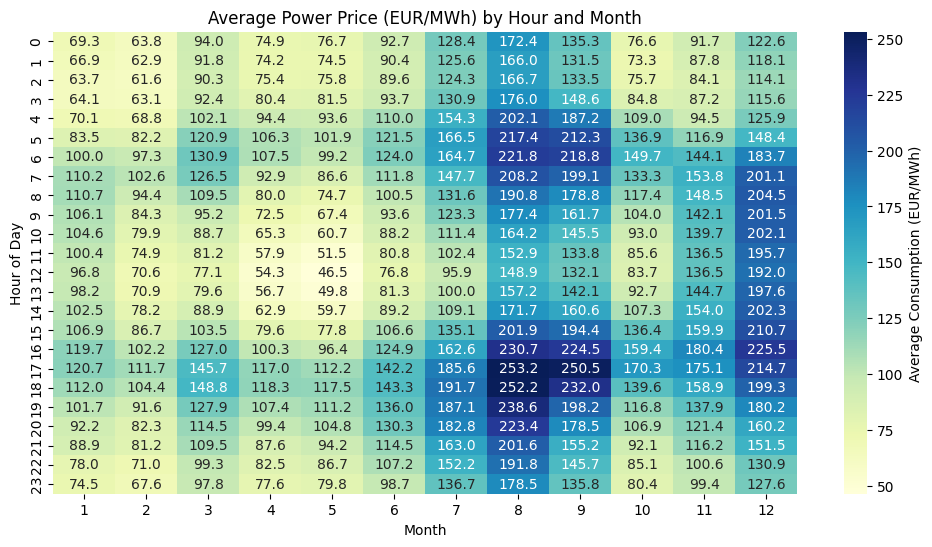

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load and clean the data
path1, path2 = "data1.csv", "data2.csv"
df = clean_data(path1, path2)

# Ensure 'time(hour)' is a datetime type
df['time(hour)'] = pd.to_datetime(df['time(hour)'])

# Extract 'hour' and 'month' from 'time(hour)'
df['hour'] = df['time(hour)'].dt.hour
df['month'] = df['time(hour)'].dt.month

# Create the pivot table for average consumption per hour and month
pivot_table = pd.pivot_table(
    df,
    values='power.de.price.day_ahead.euromwh.h.obs.cet.epex',
    index='hour',
    columns='month',
    aggfunc='mean'
)

# Plot the heat map
plt.figure(figsize=(12, 6))
sns.heatmap(pivot_table, cmap="YlGnBu", annot=True, fmt=".1f", cbar_kws={'label': 'Power Price (EUR/MWh)'})
plt.title("Average Power Price (EUR/MWh) by Hour and Month")
plt.xlabel("Month")
plt.ylabel("Hour of Day")
plt.show()

#NOTICE: the strong value in august 2022 is biased by the energy crisis in 2022 but we have high value in december and january.

# REESULT ON AUTO-CORRELATION: due to the presence of the biais of energy crisis in august 2022 we will not be able to use generality from 
# month but maybe we can use it with hours. Noticing that price value is always a little bit highter at the end of the day.